# Pytorch Hooks

Code Reference: 

* https://www.kaggle.com/code/sironghuang/understanding-pytorch-hooks/notebook

* https://blog.paperspace.com/pytorch-hooks-gradient-clipping-debugging/#:~:text=PyTorch%20provides%20two%20types%20of%20hooks.&text=A%20forward%20hook%20is%20executed,backward%20functions%20of%20an%20Autograd.

* https://medium.com/the-dl/how-to-use-pytorch-hooks-5041d777f904

In [1]:
import numpy as np
import zipfile
import gc
import cv2
import math
import warnings
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms
import torch.utils.data as data_utils
import torch
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn as nn
# import torchmetrics
import torch.nn.functional as F
import PIL
# import pytorch_lightning as pl
import imutils
import torch.optim as optim

from sklearn.metrics import confusion_matrix, roc_curve
from torch.utils.data import Dataset
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.python.client import device_lib
from zipfile import ZipFile
from IPython import display
from google.colab.patches import cv2_imshow
# from pytorch_lightning.loggers import TensorBoardLogger
from imutils.contours import sort_contours

print("Device Specifications:")
print(device_lib.list_local_devices())

Device Specifications:
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 15702412193549609130
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 13825277952
locality {
  bus_id: 1
  links {
  }
}
incarnation: 6822580629097506343
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## Data Preparation and Preprocessing

In [3]:
mnist_train_transform = transforms.Compose([
    transforms.RandomAffine(degrees = 10, translate = (0.1, 0.1), shear = 2),
    transforms.RandomRotation(50),
    transforms.ToTensor(),
    transforms.Normalize((0.5, ), (0.5, )) # Scale to -1 to 1
])

mnist_validation_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, ), (0.5, )),
])

mnist_trainset = torchvision.datasets.MNIST('emnist', 
                                      train = True, 
                                      download = True,
                                      transform = mnist_train_transform)

mnist_valset = torchvision.datasets.MNIST('emnist', 
                                      train = False, 
                                      download = True,
                                      transform = mnist_validation_transform)

print(mnist_trainset.data.shape)
print(mnist_valset.data.shape)

print(mnist_trainset.targets.shape)
print(mnist_valset.targets.shape)

100%|██████████| 9912422/9912422 [00:00<00:00, 102192300.73it/s]


Extracting emnist/MNIST/raw/train-images-idx3-ubyte.gz to emnist/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 11191398.17it/s]


Extracting emnist/MNIST/raw/train-labels-idx1-ubyte.gz to emnist/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 23591969.18it/s]


Extracting emnist/MNIST/raw/t10k-images-idx3-ubyte.gz to emnist/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 6287303.22it/s]


Extracting emnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to emnist/MNIST/raw

torch.Size([60000, 28, 28])
torch.Size([10000, 28, 28])
torch.Size([60000])
torch.Size([10000])


In [4]:
batch_size = 128

mnist_train_loader = torch.utils.data.DataLoader(
    mnist_trainset, 
    batch_size = batch_size, 
    shuffle = True,
)

mnist_validation_loader = torch.utils.data.DataLoader(
    mnist_valset, 
    batch_size = batch_size, 
    shuffle = False
)

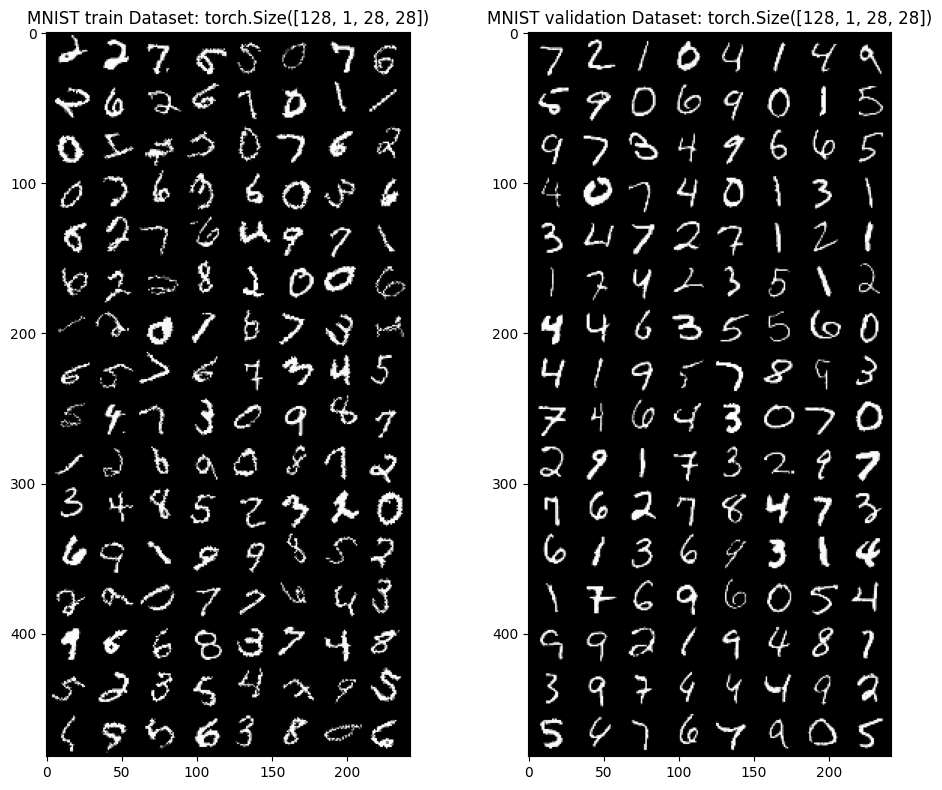

In [5]:
def plot_images_in_grid(title, images, labels, figsize = (5, 5), MIN_INDEX_PLOT = 0, MAX_INDEX_PLOT = 20):
  plt.figure(figsize = (5, 5))
  plt.suptitle(title)
  for index in range(MIN_INDEX_PLOT, MAX_INDEX_PLOT):
    plt.subplot(5, 5, index + 1)
    plt.axis('off')
    plt.text(x = 10, y = 0.5, s = labels[index], fontsize = 10, bbox = dict(facecolor = 'white'))
    plt.imshow(images[index], cmap = 'gray')

def visualize_grid(images_in_batch):
  grid_images_in_batch = torchvision.utils.make_grid(images_in_batch)
  plt_compatible_grid_images_in_batch = np.transpose(grid_images_in_batch.numpy(), (1, 2, 0))
  plt.imshow(plt_compatible_grid_images_in_batch)

def visualize_dataloader(data_loader, title):
  iter_loader = iter(data_loader)
  sample_image_batch, sample_labels_batch = next(iter_loader)

  plt.title(f"{title} Dataset: {sample_image_batch.shape}")
  visualize_grid(sample_image_batch)

def debug_dataloader(data_loader, title, expected_batch_size):
   print(f"Debugging {title}...")
   iter_loader = iter(data_loader)
   total_exact_same_batches = 0
   different_batches = []
   print(list(data_loader))

plt.figure(figsize = (10, 8))
plt.subplot(1, 2, 1)

visualize_dataloader(mnist_train_loader, "MNIST train")

plt.subplot(1, 2, 2)
visualize_dataloader(mnist_validation_loader, "MNIST validation")

plt.tight_layout()
plt.show()

## Data Modelling

Let's create a simple network to demonstrate how pytorch hooks work.

This model is based on my project: OCR For Travelling Place Detection

In [19]:
class MNISTModel(nn.Module):
  def __init__(self):
    super().__init__()

    # We calculate this formula for padding.
    # NOTES: Filter_size = kernel_size
    # In this case, we use same padding, the formula is: [(filter_size  - 1) / 2] ( Same Padding--> input size = output size).

    # Formula of feature map size: [(input_size - filter_size + 2(padding) / stride) + 1]
    # Output after conv1: [(28 - 3 + 2 (1) / 1) + 1] = 28
    # Output after MaxPool1 = 28 / 2 = 14
    self.conv1 = nn.Sequential(
        nn.Conv2d(in_channels = 1, out_channels = 32, kernel_size = 3, padding = 1, bias = True), 
        nn.ReLU(), 
        nn.MaxPool2d(2,2))

    # To attain same padding: we use features of 
    # Padding: [(3 - 1) / 2] = 1
    # Output after conv2: [(14 - 3 + 2 (1) / 1) + 1] = 14
    # Output after MaxPool2: 14 / 2 = 7
    self.conv2 = nn.Sequential(
      nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, padding = 1, bias = True), 
      nn.ReLU(), 
      nn.MaxPool2d(2,2)
    )

    self.conv3 = nn.Sequential(
      nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, padding = 1, bias = True), 
      nn.ReLU(), 
      nn.MaxPool2d(2,2)
    )

    # Flatten the layers.
    # 32 = number of filters
    # 7 = size of max pool 2 feature map output.
    self.fc1 = nn.Sequential(
      nn.Flatten(), 
      nn.Linear(128*3*3,64), 
      nn.ReLU(), 
      nn.Linear(64,32),
      nn.ReLU()
    )
    self.fc2 = nn.Sequential(
      nn.Linear(32,16), 
      nn.ReLU(), 
      nn.Linear(16,8), 
      nn.ReLU()
    )
    self.fc3 = nn.Sequential(nn.Linear(8,10))

  def forward(self, x):
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = self.fc1(x)
    x = self.fc2(x)
    x = self.fc3(x)
    return x

mnist_model = MNISTModel().to(device)
mnist_model

MNISTModel(
  (conv1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc1): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=1152, out_features=64, bias=True)
    (2): ReLU()
    (3): Linear(in_features=64, out_features=32, bias=True)
    (4): ReLU()
  )
  (fc2): Sequential(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=8, bias=True)
    (

## Example 1: Basic Usage of Visualizing Forward Propagation

Create A Hook Class

In [165]:
def visualize_pytorch_grid(images_in_batch):
  plt.figure(figsize = (400, 200))
  grid_images_in_batch = torchvision.utils.make_grid(images_in_batch)
  plt_compatible_grid_images_in_batch = np.transpose(grid_images_in_batch.detach().cpu().numpy(), (1, 2, 0))
  plt.imshow(plt_compatible_grid_images_in_batch)

class ForwardBasicHook():
  """
  Get All of Layers Outputs, mainly for Visualization.
  """
  def __init__(self, layer_name, layer):
    self.layer_name = layer_name
    self.layer = layer
    layer.register_forward_hook(self.forward_hook_fn)

  def forward_hook_fn(self, layer, input, output):
    self.outputs = output

  def visualize_output(self):
    hstacked_output = torch.hstack(list(self.outputs))
    hstacked_output = hstacked_output.unsqueeze(1)
    visualize_pytorch_grid(hstacked_output)

    plt.title(self.layer_name)    
    plt.tight_layout()
    plt.show()

  def close(self):
    self.hook.remove()

for index, layer in enumerate(list(mnist_model._modules.items())):
  print(f"{index}: {layer}")
  break

for index, layer in enumerate(list(mnist_model._modules.items())):
  print(f"{index}: {layer}")
  break

0: ('conv1', Sequential(
  (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
))
0: ('conv1', Sequential(
  (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
))


In [166]:
loss_func = nn.CrossEntropyLoss()
mnist_model = MNISTModel().to(device)

optimizer = optim.Adam(mnist_model.parameters(), lr=0.001)

In [167]:
hooks_forward_propagation = []

for layers_tuple in mnist_model._modules.items():
  layer_name = layers_tuple[0]
  layer = layers_tuple[1]
  hook = ForwardBasicHook(layer_name, layer)
  hooks_forward_propagation.append(hook)

print(hooks_forward_propagation)

[<__main__.ForwardBasicHook object at 0x7fceae552970>, <__main__.ForwardBasicHook object at 0x7fceadd491c0>, <__main__.ForwardBasicHook object at 0x7fceadd493a0>, <__main__.ForwardBasicHook object at 0x7fceadd49cd0>, <__main__.ForwardBasicHook object at 0x7fceadd49ac0>, <__main__.ForwardBasicHook object at 0x7fceadd49d30>]


In [168]:
n_epochs = 15

epochs_log = []
loss_log = []
iterations = []

for epoch in range(0, n_epochs):
  total_loss = 0
  for train_iteration, batch in enumerate(mnist_train_loader):
    images_in_batch, labels_in_batch = batch
    images_in_batch = images_in_batch.to(device)
    labels_in_batch = labels_in_batch.to(device)

    optimizer.zero_grad()

    outputs_in_batch = mnist_model(
        images_in_batch,
    )

    loss = loss_func(outputs_in_batch, labels_in_batch)
    total_loss += loss.item()
    # outputs_in_batch.backward(labels_in_batch, retain_graph = True)

    loss.backward()
    optimizer.step()

    if train_iteration % 10 == 0:
      print(f"Current Epoch: {epoch}, iteration = {train_iteration}, with current loss: {loss.item()}")
      loss_log.append(loss.item())
      iterations.append(train_iteration)
      # debug_hook(hooks_forward_propagation, hooks_backward_propagation)    

Current Epoch: 0, iteration = 0, with current loss: 2.337887763977051
Current Epoch: 0, iteration = 10, with current loss: 2.2983365058898926
Current Epoch: 0, iteration = 20, with current loss: 2.3224055767059326
Current Epoch: 0, iteration = 30, with current loss: 2.294337511062622
Current Epoch: 0, iteration = 40, with current loss: 2.140443801879883
Current Epoch: 0, iteration = 50, with current loss: 2.151566982269287
Current Epoch: 0, iteration = 60, with current loss: 2.0586190223693848
Current Epoch: 0, iteration = 70, with current loss: 2.040835380554199
Current Epoch: 0, iteration = 80, with current loss: 1.9026193618774414
Current Epoch: 0, iteration = 90, with current loss: 1.837243914604187
Current Epoch: 0, iteration = 100, with current loss: 1.841884732246399
Current Epoch: 0, iteration = 110, with current loss: 1.7380496263504028
Current Epoch: 0, iteration = 120, with current loss: 1.67241632938385
Current Epoch: 0, iteration = 130, with current loss: 1.349253058433532

KeyboardInterrupt: ignored

Visualize How Our Current Neural Network Learns.

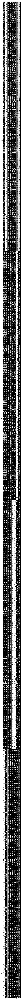

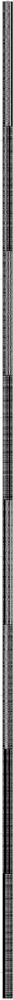

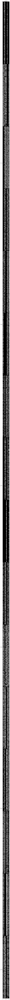

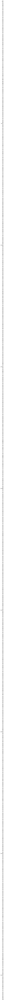

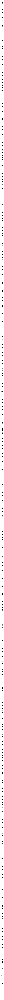

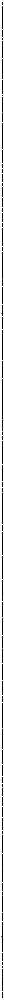

In [169]:
for hook in hooks_forward_propagation:
  hook.visualize_output()

## Example 2: Feature Extraction

## Example 3: Gradient Clipping